In [4]:
from cqed_tools.calibration import *
from cqed_tools.analysis import *
import mpld3
mpld3.enable_notebook()
import pylab
%matplotlib inline
pylab.rcParams['figure.figsize'] = (13, 8)

When Giovanna carries out an experiment she measures the strength of the cavity drive in decibel-milliwatts ie the power of the drive signal relative to 1 milliwatt. On the other hand I measure the strength of the cavity drive by the parameter $\epsilon$ in the Hamiltonian. This parameter has units of frequency. I must find a way to map between them.  

In general the drive power, $P$, is related to $\epsilon$ via $P = A \epsilon^2$ for some coefficient $A$. The power in dBm, D, is given by  

$$D=10\log_{10}(P/mW) = 10\log_{10}(A) + 20\log_{10}(\epsilon/MHz)$$  
I must find $A$. In order to solve this problem I examine Giovanna's cavity spectra to extract the dependence of the resonance frequency on the drive power. I then use my simulations to see how the resonance frequency depends on $\epsilon$. I can then create a function which maps between the two.

## Load experimental spectra ##

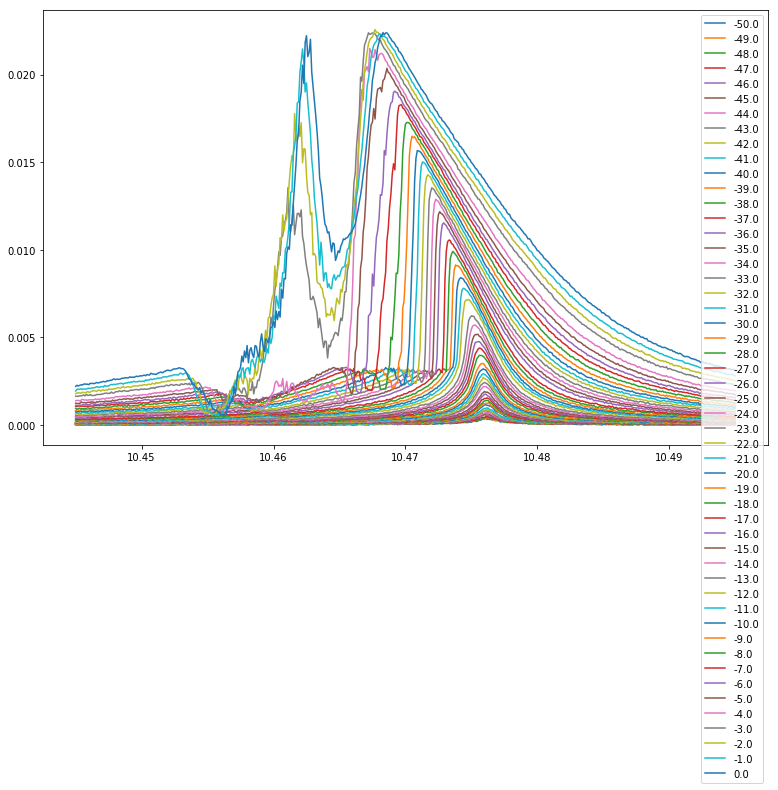

In [5]:
path = './spectra/CavC_Spectroscopy_hpulse.txt'
dataframe = load_experimental(path)

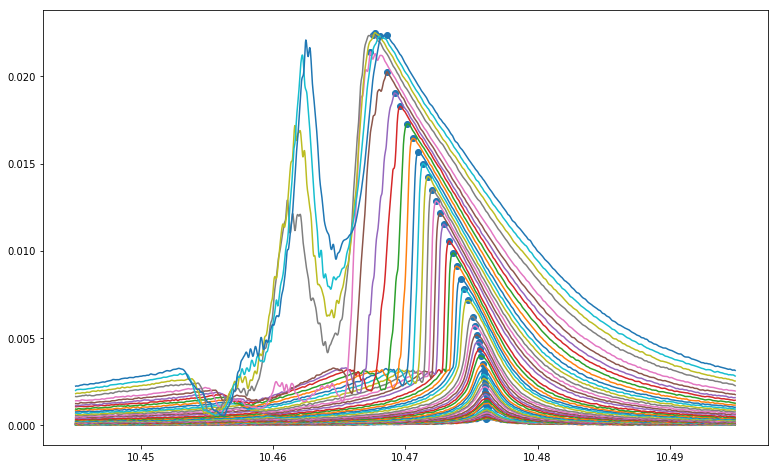

In [6]:
peaks_exp = peak_finder(dataframe, display=True, N=2)

## Load simulated spectra ##

Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.


/home/paul/anaconda3/envs/bistable/lib/python2.7/site-packages/cqed_tools-1.0.0-py2.7-linux-x86_64.egg/cqed_tools/calibration/analysis.py:183: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  collected_results = pd.concat([collected_results, results])


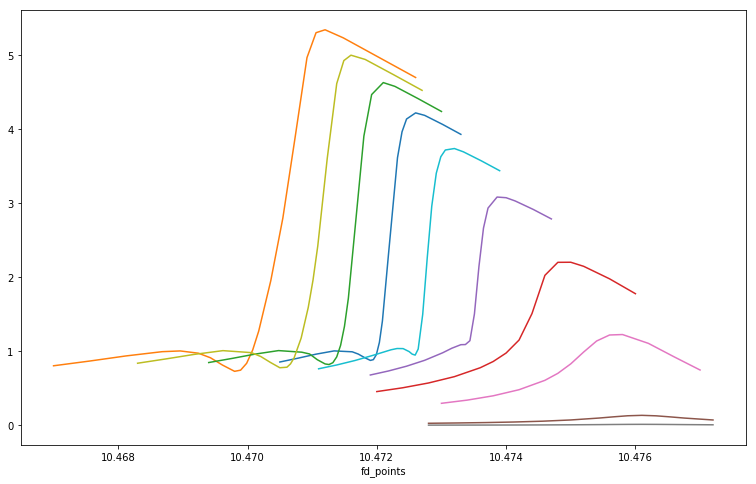

In [7]:
simulated_results = load_simulated('cuts_temperature')

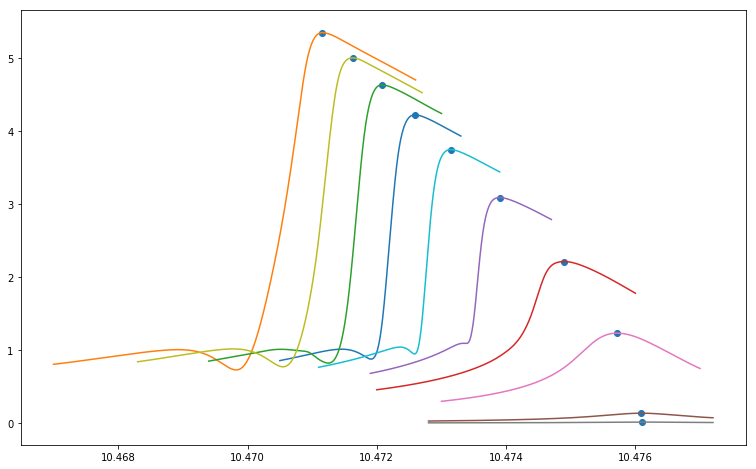

In [8]:
peaks_sim = peak_finder(simulated_results,N=1,display=True)

Text(0.5,1,'$\\epsilon$ vs frequency')

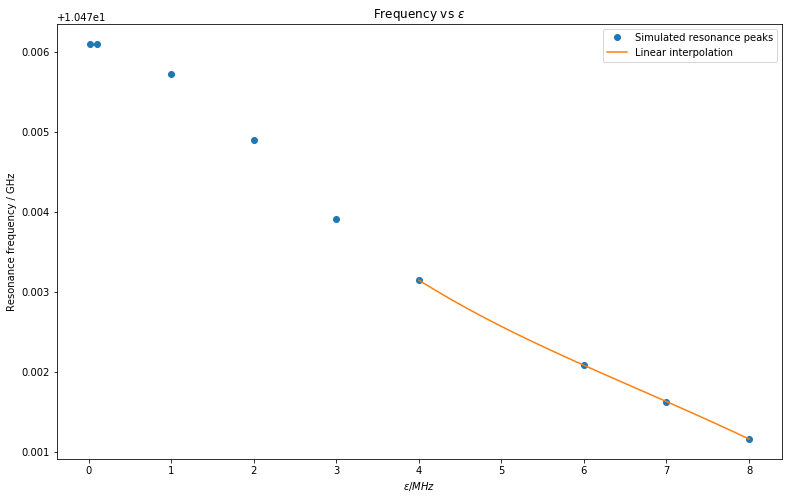

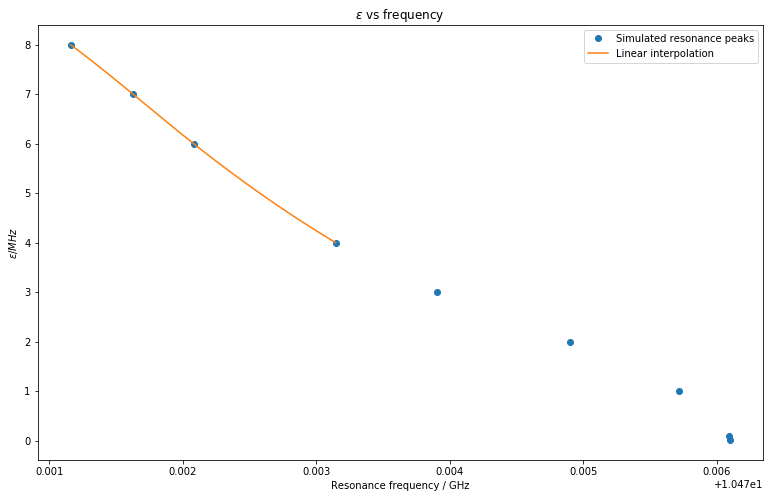

In [9]:
x = peaks_sim.index[1:]
y = peaks_sim['frequency'].values[1:]

fig, axes = plt.subplots(1, 1)
eps_to_freq = interp1d(x, y, kind='cubic', fill_value='extrapolate')
xnew = np.linspace(x[0], x[-1], num=41, endpoint=True)
axes.plot(1000*x, y, 'o', ls='')
axes.plot(1000*xnew, eps_to_freq(xnew))
axes.legend(['Simulated resonance peaks', 'Linear interpolation'], loc='best')
axes.set_xlabel(r'$\epsilon / MHz$')
axes.set_ylabel('Resonance frequency / GHz')
axes.set_title('Frequency vs $\epsilon$')

fig, axes = plt.subplots(1, 1)
freq_to_eps = interp1d(y, x, kind='cubic', fill_value='extrapolate')
ynew = np.linspace(y[0], y[-1], num=41, endpoint=True)
axes.plot(y, 1000*x, 'o', ls='')
axes.plot(ynew, 1000*freq_to_eps(ynew))
axes.legend(['Simulated resonance peaks', 'Linear interpolation'], loc='best')
axes.set_ylabel('$\epsilon / MHz$')
axes.set_xlabel('Resonance frequency / GHz')
axes.set_title('$\epsilon$ vs frequency')

In [10]:
frequencies = peaks_exp['frequency'].values
powers = np.array(peaks_exp.index)
freq_to_power = interp1d(frequencies,powers)
power_to_freq = interp1d(powers,frequencies)

Text(0,0.5,'Power (dBm)')

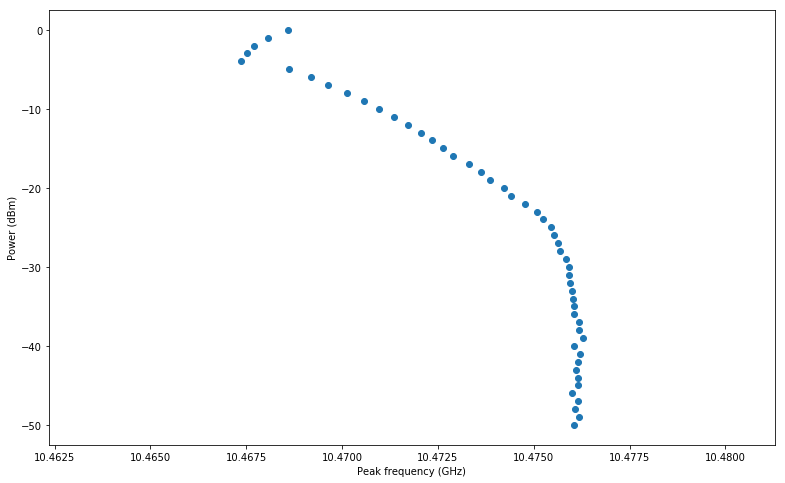

In [11]:
fig, axes = plt.subplots(1,1)

axes.scatter(frequencies, powers)
axes.set_xlabel(r'Peak frequency (GHz)')
axes.set_ylabel('Power (dBm)')

## Calculating epsilon using interpolation ##

In [12]:
powers = np.arange(-20,-9)
freq_to_eps(power_to_freq(powers))

array([ 0.00277131,  0.00303414,  0.00330817,  0.00372561,  0.00442055,
        0.00491709,  0.00545021,  0.00607386,  0.00678856,  0.00760899,
        0.00835477])

## Mapping between $\epsilon$ and power in decibels ##

linear coefficient = 8.39217575847
offset = 29.7891352783


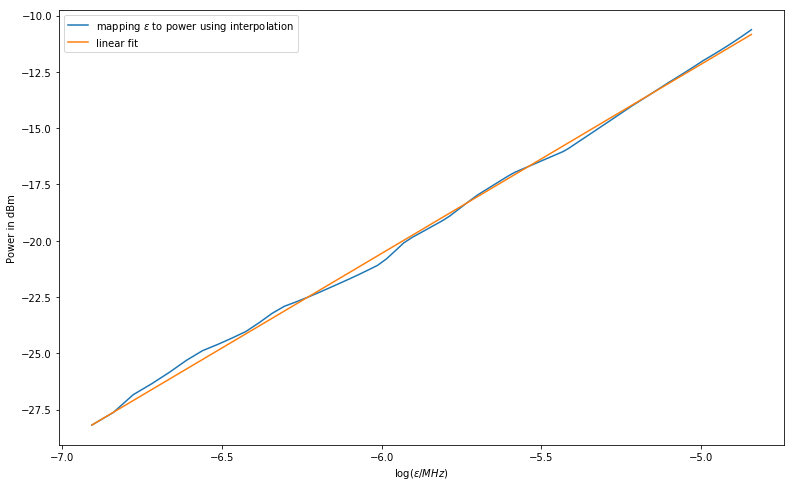

In [13]:
def eps_to_power(eps):
    power = freq_to_power(eps_to_freq(eps))
    return power

def power_to_eps(power):
    eps = freq_to_eps(power_to_freq(power))
    return eps

def lin_func_single(x, a):
    return 20*x/np.log(10) + a

eps = np.linspace(0.001,0.0079,101)
powers = freq_to_power(eps_to_freq(eps))
popt, pcov = curve_fit(lin_func, np.log(eps), powers)
plt.plot(np.log(eps),powers)
plt.plot(np.log(eps),lin_func(np.log(eps),*popt))
plt.xlabel('$\log(\epsilon/MHz)$')
plt.ylabel('Power in dBm')
plt.legend(['mapping $\epsilon$ to power using interpolation', 'linear fit'])
print 'linear coefficient = ' + str(popt[0])
print 'offset = ' + str(popt[1])

The expected linear coefficient is $20/\log(10)=8.686$.  

$D = B \log(\epsilon) + C$ where $B=8.696$ and $C=20.42$.

31.417688778


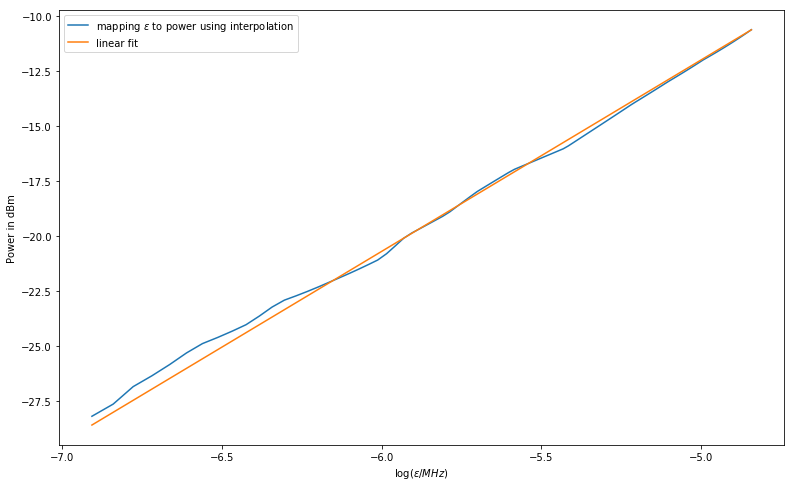

In [14]:
eps = np.linspace(0.001,0.0079,101)
powers = freq_to_power(eps_to_freq(eps))
popt, pcov = curve_fit(lin_func_single, np.log(eps), powers)
plt.plot(np.log(eps),powers)
plt.plot(np.log(eps),lin_func_single(np.log(eps),*popt))
plt.xlabel('$\log(\epsilon/MHz)$')
plt.ylabel('Power in dBm')
plt.legend(['mapping $\epsilon$ to power using interpolation', 'linear fit'])
print popt[0]
calc_params = [20/np.log(10), popt[0]]

def epsilon_calc(power, a, b):
    eps = np.exp((power - b)/a)
    return eps

# Matching Experimental Cuts #

Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.


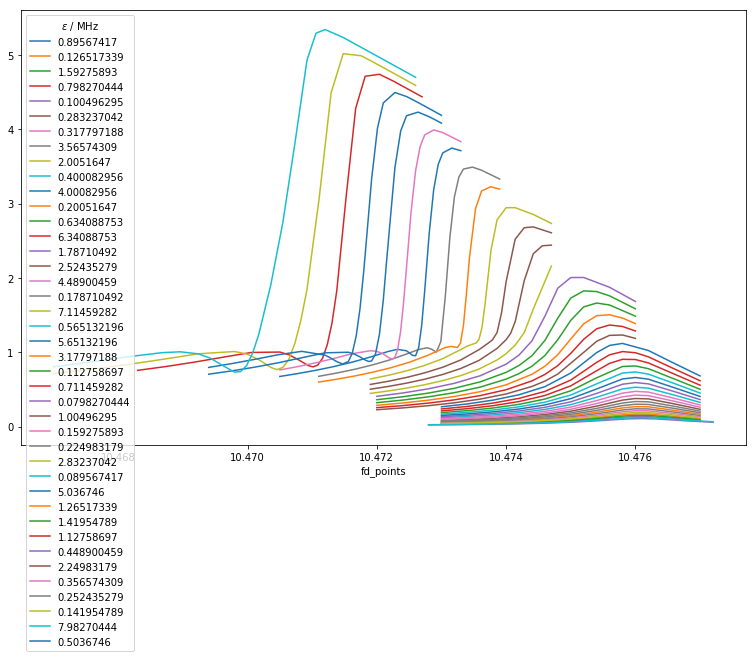

In [15]:
mpld3.disable_notebook()

sweep_path = 'matched_cuts_temperature'

fig, axes = plt.subplots(1, 1)

bottom_levels = []
for idx, (dirpath, dirnames, filenames) in enumerate(os.walk(sweep_path)):
    if not dirnames:
        bottom_levels.append(dirpath)
                    
transmissions = np.array([])
frequencies = np.array([])
drives = np.array([])

spectrum = None
legend_content = []
collected_results = None
cut_list = []

for bottom_path in bottom_levels:
    results = pd.read_hdf(bottom_path + '/results.h5')
    params = qload(bottom_path + '/params')
    results = results.set_index('fd_points')
    a_abs = np.abs(results['a'])
    a_abs.plot(ax=axes)
    marker = str(1000*params.eps)
    legend_content.append(marker)
    results['epsilon'] = params.eps
    
legend = axes.legend(legend_content)
legend.set_title(r'$\epsilon$ / MHz')

In [62]:
collected_results = load_simulated_frame('matched_cuts_temperature')
collected_results = collected_results.sort_index()

Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.


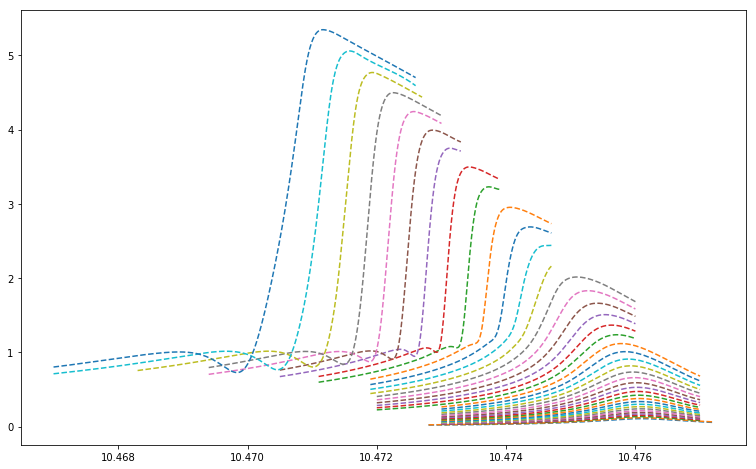

In [63]:
fig, axes = plt.subplots(1, 1)

plot_time_constants_sim(np.abs(collected_results['a']), axes=axes, interpolate=True, marker=None)

epsilon = 0.00711459282
Power = -11.0


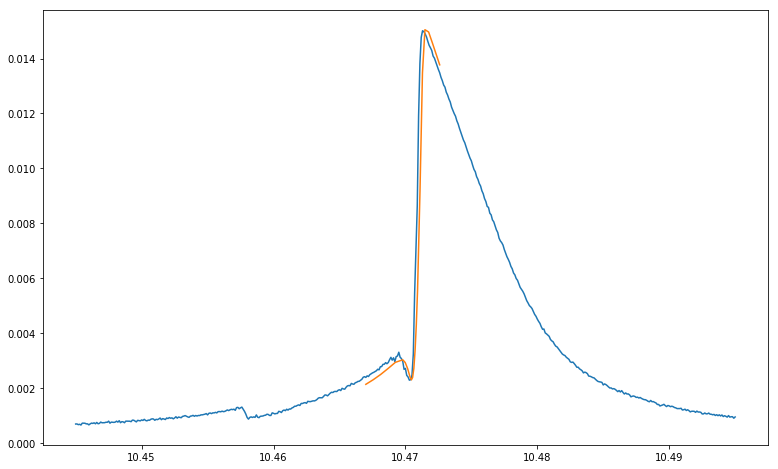

In [102]:
fig, axes = plt.subplots(1,1)
scale = 3.0e-3

exp_index = 39
sim_index = exp_index

mi = collected_results.index
eps_index = collected_results.index.names.index('eps')
eps_value = mi.levels[eps_index][sim_index]
sim_cut = collected_results.xs(eps_value, level=eps_index)

dataframe.iloc[:,exp_index].plot(ax=axes)
axes.plot(sim_cut.index, scale*np.abs(sim_cut['a']))

print('epsilon = ' + str(eps_value))
print('Power = ' + str(dataframe.columns[exp_index]))